In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalMaxPool2D, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

In [2]:
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available, please check your installation")


Num GPUs Available:  1
GPU is available


In [3]:
# dataset을 training set과 validation set으로 나누기 8:2비율
batch_size = 32
img_height = 224
img_width = 224

image_directory = './Digital images of defective and good condition tyres'


train_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율 (여기서는 20%를 검증 데이터로 사용)
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='training',  # 훈련 데이터셋을 생성하기 위해 'training' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

class_names=train_data.class_names
print(class_names)

# validation data 만들기
val_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='validation',  # 검증 데이터셋을 생성하기 위해 'validation' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

Found 1856 files belonging to 2 classes.
Using 1485 files for training.
['defective', 'good']
Found 1856 files belonging to 2 classes.
Using 371 files for validation.


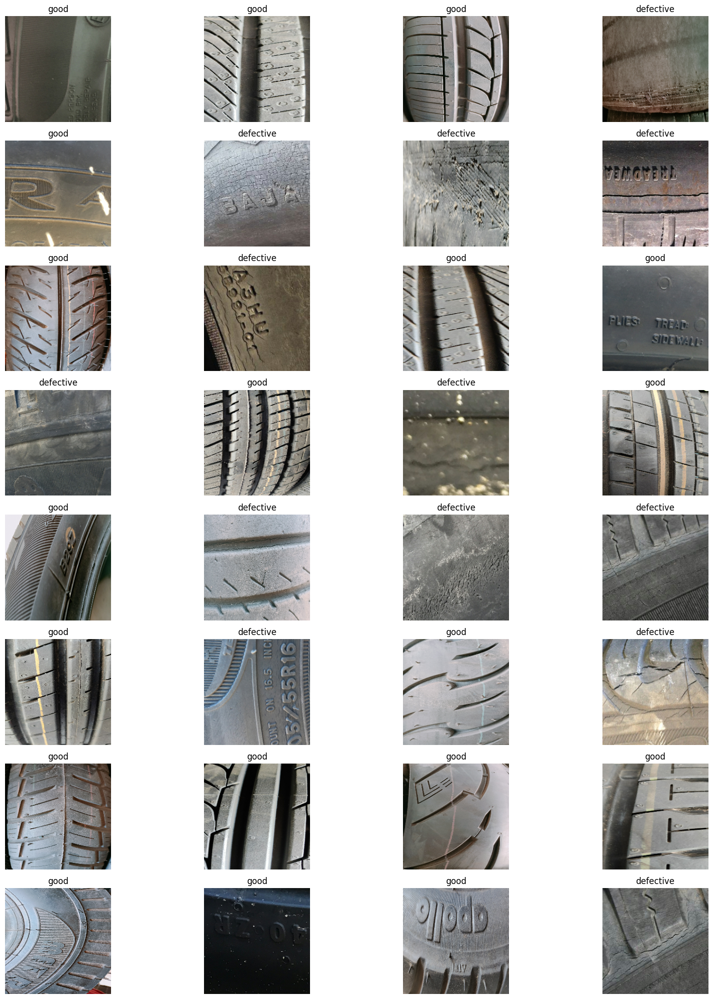

In [4]:
# Plot the images
plt.figure(figsize=(20,20), tight_layout=True, facecolor="white")
for image, label in train_data.take(1):
    for i in range(32):
        ax=plt.subplot(8, 4, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        plt.title(class_names[label[i]])
        plt.axis("off")

# 전이 학습을 통한 모델 훈련

In [5]:
import tensorflow as tf

# AlexNet 모델 정의
def AlexNet(input_shape=(224, 224, 3), classes=1):
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Conv2D(filters=96, input_shape=input_shape, kernel_size=(11, 11), strides=(4, 4), padding='valid', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))
    model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=(5, 5), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))
    model.add(tf.keras.layers.Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(4096, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(4096, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(classes, activation='sigmoid'))
    return model

# AlexNet 모델 생성
input_shape = (224, 224, 3)
alexnet_model = AlexNet(input_shape=input_shape, classes=1)

# 모델 컴파일
alexnet_model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                      optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                      metrics=["accuracy"])

# 콜백 설정
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    patience=2,
    factor=0.5,
    min_lr=0.00001,
    verbose=1
)

Early_Stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)



In [7]:
# 모델 훈련
history = alexnet_model.fit(train_data, 
                            epochs=100, 
                            validation_data=val_data, 
                            callbacks=[Early_Stopping, learning_rate_reduction], 
                            verbose=1)

Epoch 1/100
47/47 [==============================] - 10s 194ms/step - loss: 1.0312 - accuracy: 0.5899 - val_loss: 9.9064 - val_accuracy: 0.4394 - lr: 0.0010
Epoch 2/100
47/47 [==============================] - 10s 182ms/step - loss: 0.8256 - accuracy: 0.6128 - val_loss: 3.2161 - val_accuracy: 0.4987 - lr: 0.0010
Epoch 3/100
47/47 [==============================] - 10s 180ms/step - loss: 0.8417 - accuracy: 0.6404 - val_loss: 0.7699 - val_accuracy: 0.6011 - lr: 0.0010
Epoch 4/100
47/47 [==============================] - 10s 187ms/step - loss: 0.7834 - accuracy: 0.6579 - val_loss: 0.6588 - val_accuracy: 0.6765 - lr: 0.0010
Epoch 5/100
47/47 [==============================] - 10s 178ms/step - loss: 0.8650 - accuracy: 0.6599 - val_loss: 1.8753 - val_accuracy: 0.5202 - lr: 0.0010
Epoch 6/100
47/47 [==============================] - ETA: 0s - loss: 0.8495 - accuracy: 0.6370
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
47/47 [==============================] - 10s

In [8]:
alexnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 54, 54, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 54, 54, 96)       384       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 26, 26, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 26, 26, 256)       614656    
                                                                 
 batch_normalization_1 (Batc  (None, 26, 26, 256)      1024      
 hNormalization)                                                 
                                                        

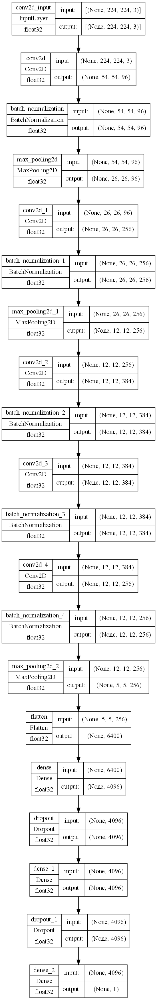

In [9]:
tf.keras.utils.plot_model(
    alexnet_model,                 # 시각화할 Keras 모델
    show_shapes=True,      # 각 레이어의 출력 형태를 시각화에 포함할지 여부(True: 각 레이어별 출력 텐서 표시)
    show_layer_names=True, # 각 레이어의 이름을 시각화에 포함할지 여부
    show_dtype=True,       # 각 레이어의 데이터 타입을 시각화에 포함할지 여부
    dpi=120                # 시각화 이미지의 해상도 설정 (점 per 인치) (높은 dpi 높은 해상도)
)

In [10]:
import pandas as pd

# history.history 속성을 사용하여 DataFrame 생성
history_dict = history.history
dataframe = pd.DataFrame(history_dict)

# DataFrame 출력
print(dataframe)


        loss  accuracy  val_loss  val_accuracy        lr
0   1.031224  0.589899  9.906442      0.439353  0.001000
1   0.825623  0.612795  3.216083      0.498652  0.001000
2   0.841681  0.640404  0.769932      0.601078  0.001000
3   0.783390  0.657912  0.658824      0.676550  0.001000
4   0.864987  0.659933  1.875322      0.520216  0.001000
5   0.849486  0.637037  5.486927      0.433962  0.001000
6   0.747153  0.654545  0.639192      0.636119  0.000500
7   0.623945  0.707071  0.574015      0.714286  0.000500
8   0.606370  0.723232  0.576977      0.668464  0.000500
9   0.577937  0.715151  0.556466      0.706199  0.000500
10  0.574830  0.696970  0.625507      0.719677  0.000500
11  0.541274  0.744781  0.593055      0.687332  0.000500
12  0.513959  0.745455  0.588090      0.673854  0.000250
13  0.487491  0.759596  0.653225      0.609164  0.000250
14  0.482286  0.758923  0.621582      0.641509  0.000125


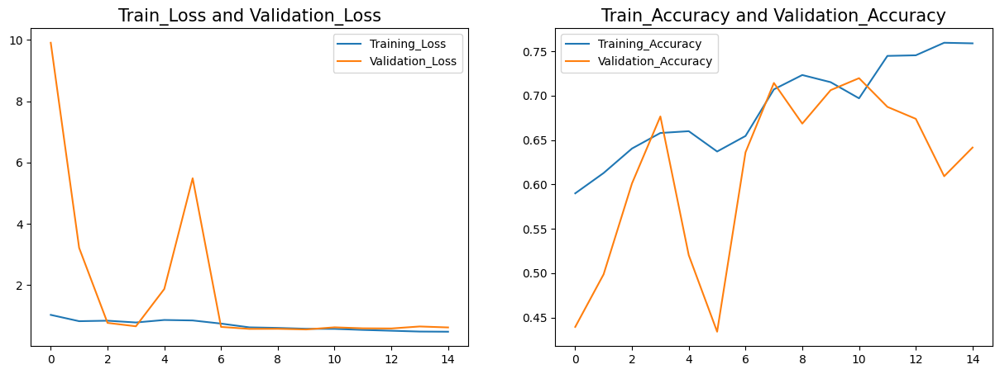

In [11]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(dataframe["loss"], label="Training_Loss")
plt.plot(dataframe["val_loss"], label="Validation_Loss")
plt.title('Train_Loss and Validation_Loss',fontsize=15)
plt.legend()

plt.subplot(1,2,2)
plt.plot(dataframe["accuracy"], label="Training_Accuracy")
plt.plot(dataframe["val_accuracy"], label="Validation_Accuracy")
plt.title('Train_Accuracy and Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [12]:
loss, accuracy=alexnet_model.evaluate(val_data)
print(f"Accuracy:{accuracy}")
print(f"Loss:{loss}")

12/12 [==============================] - 2s 68ms/step - loss: 0.5565 - accuracy: 0.7062
Accuracy:0.7061994671821594
Loss:0.5564659833908081


In [13]:
x_val=[]
y_val=[]


for image, label in val_data:
    x_val.extend(image.numpy())
    y_val.extend(label.numpy())    

In [14]:
# Lets make the Predictions
predictions=alexnet_model.predict(np.array(x_val))

y_pred=[int(np.round(prediction)) for prediction in predictions]

12/12 [==============================] - 1s 40ms/step


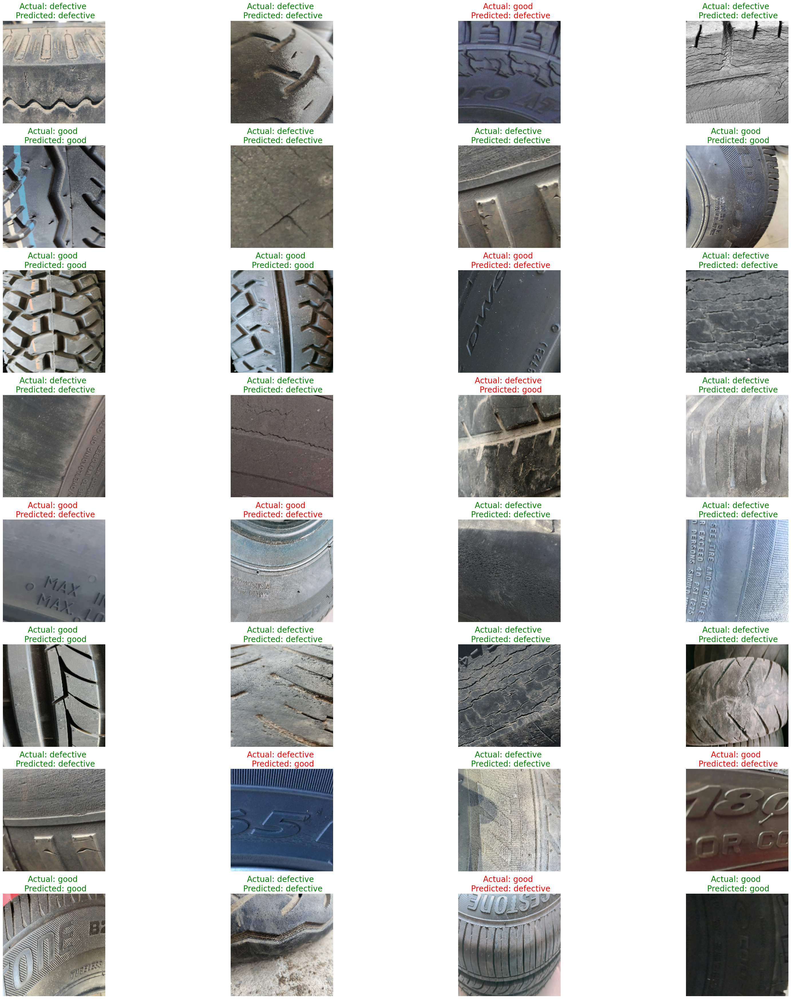

In [15]:
plt.figure(figsize=(35, 35),tight_layout=True, facecolor="white")


for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(x_val[i].astype("uint8"))
    actual_label = class_names[y_val[i]]
    predicted_label = class_names[y_pred[i]]
    
    # Check if the actual and predicted labels are the same
    if actual_label == predicted_label:
        label_color ='green'
    else:
        label_color = 'red'
    
     
    plt.title(f'Actual: {actual_label} \n Predicted: {predicted_label}', color=label_color,fontsize=20)
    plt.axis("off")

plt.show()

F1-Score:[0.6886841112573808]
Precision:[0.6868530020703933]
Recall:[0.7079629995391401]
Classification_Report
-----------------------
              precision    recall  f1-score   support

           0       0.70      0.83      0.76       210
           1       0.71      0.54      0.61       161

    accuracy                           0.71       371
   macro avg       0.71      0.69      0.69       371
weighted avg       0.71      0.71      0.70       371

Confusion_Matrix
----------------------


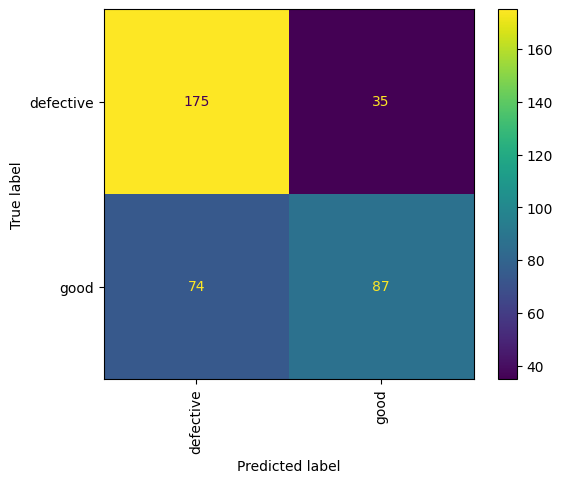

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report, ConfusionMatrixDisplay

f1_scores=[]
precision_scores=[]
recall_scores=[]

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))


# Print the Results
print(f"F1-Score:{f1_scores}")
print(f"Precision:{precision_scores}")
print(f"Recall:{recall_scores}")



print("Classification_Report")
print("-----------------------")
print(classification_report(y_val,y_pred))
print("Confusion_Matrix")
print("----------------------")
ConfusionMatrixDisplay.from_predictions(y_val, y_pred, display_labels=class_names, xticks_rotation="vertical")
plt.show()


In [17]:
model_name=["AlexNet"]
result_df= pd.DataFrame({"F1_Score":f1_scores, "Precision_Score":precision_scores, "Recall_Score":recall_scores}, index=model_name)
result_df= result_df.T.sort_values(by="AlexNet", ascending=False)
result_df

,AlexNet
Recall_Score,0.707963
F1_Score,0.688684
Precision_Score,0.686853


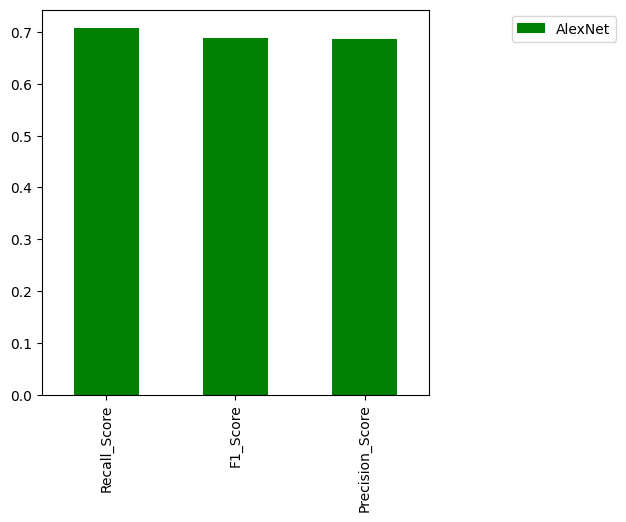

In [18]:
result_df.plot(kind="bar",figsize=(5,5), color="Green").legend(bbox_to_anchor=(1.5,1))